<a href="https://colab.research.google.com/github/gaallmin/Prediction-of-Agricultural-Product-prices/blob/yeji/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 농산물 가격 예측을 위한 AI 모델 개발
- '2024 농산물 가격 예측 AI 경진대회'는 데이터와 AI 기술을 활용하여 농산물 가격 예측 능력을 향상시키는 것을 목표로 합니다.<br>  이 대회는 농업 분야의 복잡한 시계열 데이터를 효율적으로 분석하고 예측할 수 있는 AI 알고리즘 개발에 초점을 맞추고 있습니다. <br> <br>
- 이 대회의 궁극적 목적은 참가자들의 시계열 데이터 분석 및 예측 역량을 강화하고, <br> AI 기술이 실제 농산물 가격 예측과 관련 정책 결정에 어떻게 기여할 수 있는지 탐구하는 것입니다.

In [ ]:
from google.colab import drive

drive.mount('/content/drive/')
%cd /content/drive/MyDrive/Dacon

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
/content/drive/MyDrive/Dacon


In [ ]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 1s (10.3 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 123620 files and direc

# EDA

In [ ]:
import pandas as pd

# CSV 파일 읽기
df = pd.read_csv('./train/train.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29376 entries, 0 to 29375
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   시점          29376 non-null  object 
 1   품목명         29376 non-null  object 
 2   품종명         29376 non-null  object 
 3   거래단위        29376 non-null  object 
 4   등급          29376 non-null  object 
 5   평년 평균가격(원)  29376 non-null  float64
 6   평균가격(원)     29376 non-null  float64
dtypes: float64(2), object(5)
memory usage: 1.6+ MB


In [ ]:
df['time'] = df.groupby(['품목명', '품종명', '등급']).cumcount() + 1
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29376 entries, 0 to 29375
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   시점          29376 non-null  object 
 1   품목명         29376 non-null  object 
 2   품종명         29376 non-null  object 
 3   거래단위        29376 non-null  object 
 4   등급          29376 non-null  object 
 5   평년 평균가격(원)  29376 non-null  float64
 6   평균가격(원)     29376 non-null  float64
 7   time        29376 non-null  int64  
dtypes: float64(2), int64(1), object(5)
memory usage: 1.8+ MB


In [ ]:
df

,시점,품목명,품종명,거래단위,등급,평년 평균가격(원),평균가격(원),time
0,201801상순,건고추,화건,30 kg,상품,381666.666667,590000.0,1
1,201801중순,건고추,화건,30 kg,상품,380809.666667,590000.0,2
2,201801하순,건고추,화건,30 kg,상품,380000.000000,590000.0,3
3,201802상순,건고추,화건,30 kg,상품,380000.000000,590000.0,4
4,201802중순,건고추,화건,30 kg,상품,376666.666667,590000.0,5
...,...,...,...,...,...,...,...,...
29371,202111중순,대파,대파(일반),10키로묶음,상,0.000000,0.0,284
29372,202111하순,대파,대파(일반),10키로묶음,상,0.000000,0.0,285
29373,202112상순,대파,대파(일반),10키로묶음,상,0.000000,0.0,286
29374,202112중순,대파,대파(일반),10키로묶음,상,0.000000,0.0,287


## 1. 각 품목 아래 어떤 품종, 거래단위, 등급이 있는지 확인

In [ ]:
# '품목명'에 따른 '품종명'과 '등급'을 오름차순으로 정렬
grouped_data = df[['품목명', '품종명', '등급']].drop_duplicates()
grouped_data = grouped_data.sort_values(by=['품목명', '품종명', '등급'], ascending=True).reset_index(drop=True)

# 그룹별로 보기 편하게 출력
for item_name in df['품목명'].unique():
    print(f"품목명: {item_name}")
    print(grouped_data[grouped_data['품목명'] == item_name])
    print("-" * 50)

품목명: 건고추
    품목명   품종명  등급
33  건고추    양건  상품
34  건고추    양건  중품
35  건고추  햇산양건  상품
36  건고추  햇산양건  중품
37  건고추  햇산화건  상품
38  건고추  햇산화건  중품
39  건고추    화건  상품
40  건고추    화건  중품
--------------------------------------------------
품목명: 사과
   품목명  품종명  등급
94  사과  쓰가루  상품
95  사과  쓰가루  중품
96  사과   홍로  상품
97  사과   홍로  중품
98  사과   후지  상품
99  사과   후지  중품
--------------------------------------------------
품목명: 감자
   품목명        품종명 등급
0   감자         감자  상
1   감자         감자  중
2   감자         감자  특
3   감자         감자  하
4   감자      감자 대지  상
5   감자      감자 대지  중
6   감자      감자 대지  특
7   감자      감자 대지  하
8   감자      감자 두백  상
9   감자      감자 두백  중
10  감자      감자 두백  특
11  감자      감자 두백  하
12  감자      감자 수미  상
13  감자      감자 수미  중
14  감자      감자 수미  특
15  감자      감자 수미  하
16  감자  감자 수미(저장)  상
17  감자  감자 수미(저장)  중
18  감자  감자 수미(저장)  특
19  감자  감자 수미(저장)  하
20  감자   감자 수미(햇)  상
21  감자   감자 수미(햇)  중
22  감자   감자 수미(햇)  특
23  감자   감자 수미(햇)  하
24  감자      감자 수입  상
25  감자      감자 조풍  상
26  감자      감자 조풍  중
27  감자     

## 2. 품목별 데이터 수 확인

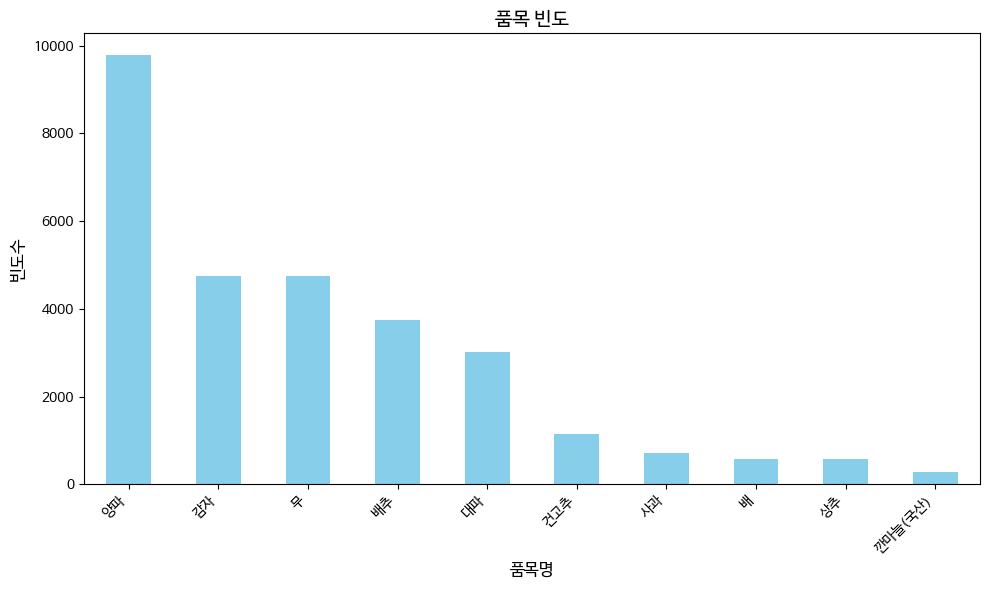

In [ ]:
import matplotlib.pyplot as plt
plt.rc('font', family='NanumBarunGothic')

# '품목명' 열의 값을 그룹화하여 빈도수 계산
class_name_counts = df['품목명'].value_counts()

# 막대그래프 그리기
plt.figure(figsize=(10, 6))
class_name_counts.plot(kind='bar', color='skyblue')

# 그래프 제목 및 축 라벨 설정
plt.title('품목 빈도', fontsize=14)
plt.xlabel('품목명', fontsize=12)
plt.ylabel('빈도수', fontsize=12)

# 그래프 보여주기
plt.xticks(rotation=45, ha='right')  # x축 라벨을 45도 기울여서 읽기 쉽게 설정
plt.tight_layout()  # 그래프를 깔끔하게 배치
plt.show()

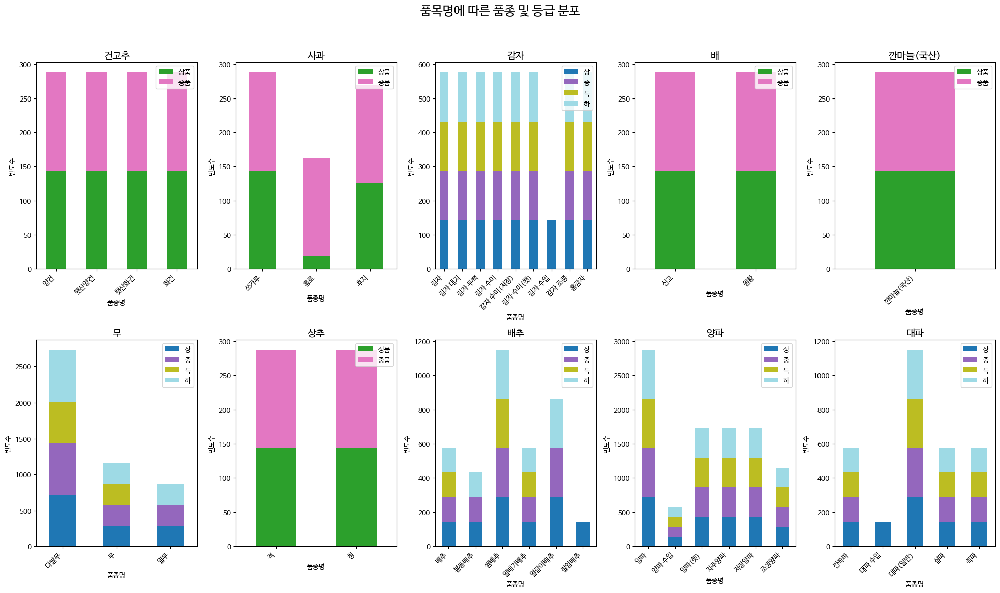

In [ ]:
# '품목명', '품종명', '등급'에 따른 빈도수 계산
item_variety_grade_counts = df.groupby(['품목명', '품종명', '등급']).size().unstack(fill_value=0)

# 품목명별로 그래프 그리기
unique_items = df['품목명'].unique()

# 서브플롯 설정 (2행 5열, 즉 10개의 그래프)
fig, axes = plt.subplots(2, 5, figsize=(20, 12))  # 2x5의 서브플롯을 생성

# 전체 그래프 제목 설정
fig.suptitle('품목명에 따른 품종 및 등급 분포', fontsize=18)

# 각 그래프 그리기
for i, item in enumerate(unique_items):
    # 현재 '품목명'에 해당하는 데이터만 추출
    item_data = item_variety_grade_counts.loc[item]

    # 해당 그래프가 들어갈 subplot 위치 설정
    ax = axes[i // 5, i % 5]  # 2행 5열에서 현재 위치 계산

    # 막대그래프 그리기 (stacked bar chart)
    bars = item_data.plot(kind='bar', stacked=True, ax=ax, colormap='tab20')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{item}', fontsize=14)
    ax.set_xlabel('품종명', fontsize=10)
    ax.set_ylabel('빈도수', fontsize=10)

    # x축 라벨 회전
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

    # 등급별로 존재하는 것만 legend로 설정
    handles, labels = ax.get_legend_handles_labels()
    visible_legend = [h for h, l in zip(handles, labels) if any(item_data[l] > 0)]
    visible_labels = [l for h, l in zip(handles, labels) if any(item_data[l] > 0)]
    ax.legend(visible_legend, visible_labels)

    # legend 위치를 오른쪽 상단으로 설정
    ax.legend(visible_legend, visible_labels, loc='upper right')

# 그래프 레이아웃 조정
plt.tight_layout(rect=[0, 0, 1, 0.95])  # 제목 공간 확보를 위해 rect 설정
plt.show()

## 3. 결측치 확인

In [ ]:
import pandas as pd

# '평년 평균가격'이 0인 전체 행의 수
zero_price_count = df[df['평년 평균가격(원)'] == 0].shape[0]
print(f"'평년 평균가격'이 0인 전체 행의 수: {zero_price_count}")

# '품목명', '품종명', '등급'에 따라 '평년 평균가격'이 0인 행의 수를 그룹화하여 계산
grouped_zero_price_count = df[df['평년 평균가격(원)'] == 0].groupby(['품목명', '품종명', '등급']).size()

# 결과 출력
grouped_zero_price_count

'평년 평균가격'이 0인 전체 행의 수: 21860


품목명  품종명    등급
감자   감자     상     144
            중     144
            특     144
            하     144
     감자 대지  상     110
                 ... 
양파   저장양파   하     432
     조생양파   상     288
            중     288
            특     288
            하     288
Length: 100, dtype: int64

In [ ]:
import pandas as pd

# '평균가격'이 0인 전체 행의 수
zero_price_count = df[df['평균가격(원)'] == 0].shape[0]
print(f"'평균가격'이 0인 전체 행의 수: {zero_price_count}")

# '품목명', '품종명', '등급'에 따라 '평균가격'이 0인 행의 수를 그룹화하여 계산
grouped_zero_price_count = df[df['평균가격(원)'] == 0].groupby(['품목명', '품종명', '등급']).size()

# 결과 출력
grouped_zero_price_count

'평균가격'이 0인 전체 행의 수: 12713


품목명  품종명    등급
감자   감자     상      31
            중      31
            특      31
            하      31
     감자 대지  상      55
                 ... 
양파   저장양파   하     310
     조생양파   상     288
            중     288
            특     288
            하     288
Length: 95, dtype: int64

## 4. 품목별&품종별&등급별 평년 평균가격과 평균가격 선 그래프로 시각화

### 건고추

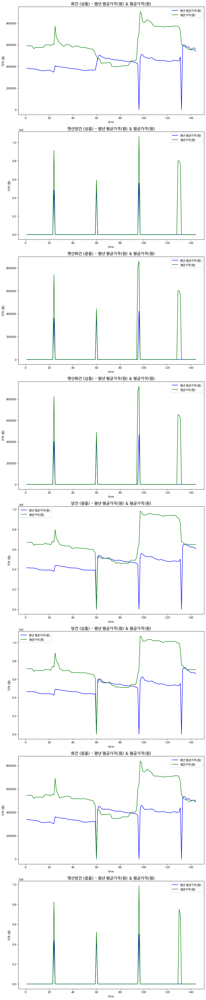

In [ ]:
import matplotlib.pyplot as plt

# '감자' 품목에 대한 데이터 필터링
potato = df[df['품목명'] == '건고추']

# 고유한 '품종명'과 '등급'의 조합 목록 추출
unique_combinations = potato[['품종명', '등급']].drop_duplicates()

# 서브플롯 설정 (품종명 * 등급별로 하나의 그래프)
fig, axes = plt.subplots(len(unique_combinations), 1, figsize=(10, 6 * len(unique_combinations)))

# 만약 조합이 하나라면 axes가 배열이 아니므로 배열로 만듦
if len(unique_combinations) == 1:
    axes = [axes]

# 각 '품종명'과 '등급' 조합별로 그래프 그리기
for i, (variety, grade) in enumerate(unique_combinations.itertuples(index=False)):
    # 현재 '품종명'과 '등급'에 해당하는 데이터만 추출
    variety_grade_data = potato[(potato['품종명'] == variety) & (potato['등급'] == grade)]

    # 현재 서브플롯 선택
    ax = axes[i]

    # 평년 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평년 평균가격(원)'], label='평년 평균가격(원)', color='b')

    # 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평균가격(원)'], label='평균가격(원)', color='g')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{variety} ({grade}) - 평년 평균가격(원) & 평균가격(원)', fontsize=14)
    ax.set_xlabel('time', fontsize=10)
    ax.set_ylabel('가격 (원)', fontsize=10)

    # 범례 추가
    ax.legend()

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


### 사과

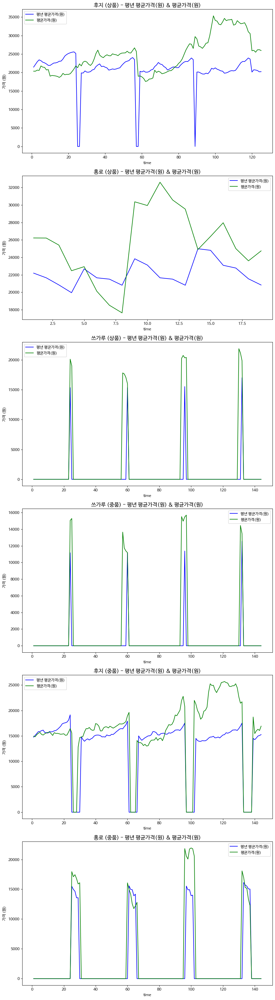

In [ ]:
import matplotlib.pyplot as plt

# '감자' 품목에 대한 데이터 필터링
potato = df[df['품목명'] == '사과']

# 고유한 '품종명'과 '등급'의 조합 목록 추출
unique_combinations = potato[['품종명', '등급']].drop_duplicates()

# 서브플롯 설정 (품종명 * 등급별로 하나의 그래프)
fig, axes = plt.subplots(len(unique_combinations), 1, figsize=(10, 6 * len(unique_combinations)))

# 만약 조합이 하나라면 axes가 배열이 아니므로 배열로 만듦
if len(unique_combinations) == 1:
    axes = [axes]

# 각 '품종명'과 '등급' 조합별로 그래프 그리기
for i, (variety, grade) in enumerate(unique_combinations.itertuples(index=False)):
    # 현재 '품종명'과 '등급'에 해당하는 데이터만 추출
    variety_grade_data = potato[(potato['품종명'] == variety) & (potato['등급'] == grade)]

    # 현재 서브플롯 선택
    ax = axes[i]

    # 평년 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평년 평균가격(원)'], label='평년 평균가격(원)', color='b')

    # 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평균가격(원)'], label='평균가격(원)', color='g')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{variety} ({grade}) - 평년 평균가격(원) & 평균가격(원)', fontsize=14)
    ax.set_xlabel('time', fontsize=10)
    ax.set_ylabel('가격 (원)', fontsize=10)

    # 범례 추가
    ax.legend()

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


### 감자

<ipython-input-49-ccac4dbc0a90>:39: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


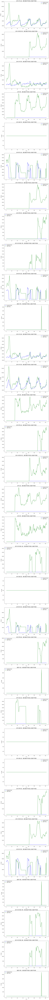

In [ ]:
import matplotlib.pyplot as plt

# '감자' 품목에 대한 데이터 필터링
potato = df[df['품목명'] == '감자']

# 고유한 '품종명'과 '등급'의 조합 목록 추출
unique_combinations = potato[['품종명', '등급']].drop_duplicates()

# 서브플롯 설정 (품종명 * 등급별로 하나의 그래프)
fig, axes = plt.subplots(len(unique_combinations), 1, figsize=(10, 6 * len(unique_combinations)))

# 만약 조합이 하나라면 axes가 배열이 아니므로 배열로 만듦
if len(unique_combinations) == 1:
    axes = [axes]

# 각 '품종명'과 '등급' 조합별로 그래프 그리기
for i, (variety, grade) in enumerate(unique_combinations.itertuples(index=False)):
    # 현재 '품종명'과 '등급'에 해당하는 데이터만 추출
    variety_grade_data = potato[(potato['품종명'] == variety) & (potato['등급'] == grade)]

    # 현재 서브플롯 선택
    ax = axes[i]

    # 평년 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평년 평균가격(원)'], label='평년 평균가격(원)', color='b')

    # 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평균가격(원)'], label='평균가격(원)', color='g')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{variety} ({grade}) - 평년 평균가격(원) & 평균가격(원)', fontsize=14)
    ax.set_xlabel('time', fontsize=10)
    ax.set_ylabel('가격 (원)', fontsize=10)

    # 범례 추가
    ax.legend()

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


### 배

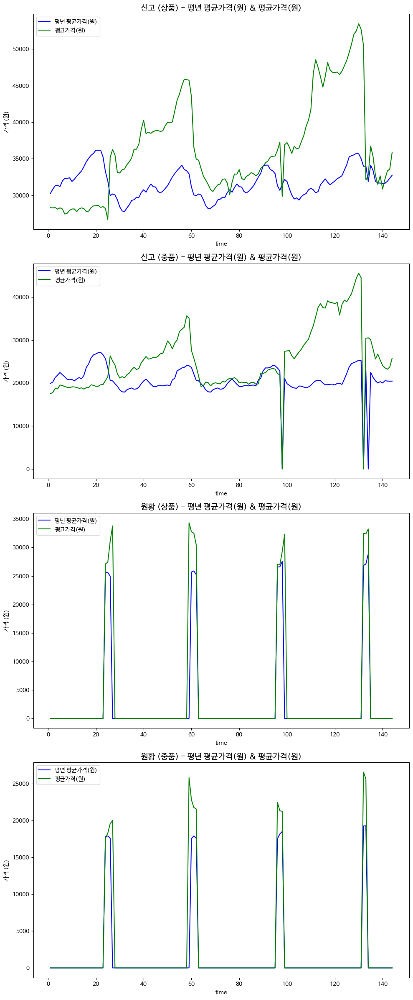

In [ ]:
import matplotlib.pyplot as plt

# '감자' 품목에 대한 데이터 필터링
potato = df[df['품목명'] == '배']

# 고유한 '품종명'과 '등급'의 조합 목록 추출
unique_combinations = potato[['품종명', '등급']].drop_duplicates()

# 서브플롯 설정 (품종명 * 등급별로 하나의 그래프)
fig, axes = plt.subplots(len(unique_combinations), 1, figsize=(10, 6 * len(unique_combinations)))

# 만약 조합이 하나라면 axes가 배열이 아니므로 배열로 만듦
if len(unique_combinations) == 1:
    axes = [axes]

# 각 '품종명'과 '등급' 조합별로 그래프 그리기
for i, (variety, grade) in enumerate(unique_combinations.itertuples(index=False)):
    # 현재 '품종명'과 '등급'에 해당하는 데이터만 추출
    variety_grade_data = potato[(potato['품종명'] == variety) & (potato['등급'] == grade)]

    # 현재 서브플롯 선택
    ax = axes[i]

    # 평년 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평년 평균가격(원)'], label='평년 평균가격(원)', color='b')

    # 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평균가격(원)'], label='평균가격(원)', color='g')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{variety} ({grade}) - 평년 평균가격(원) & 평균가격(원)', fontsize=14)
    ax.set_xlabel('time', fontsize=10)
    ax.set_ylabel('가격 (원)', fontsize=10)

    # 범례 추가
    ax.legend()

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


### 깐마늘(국산)

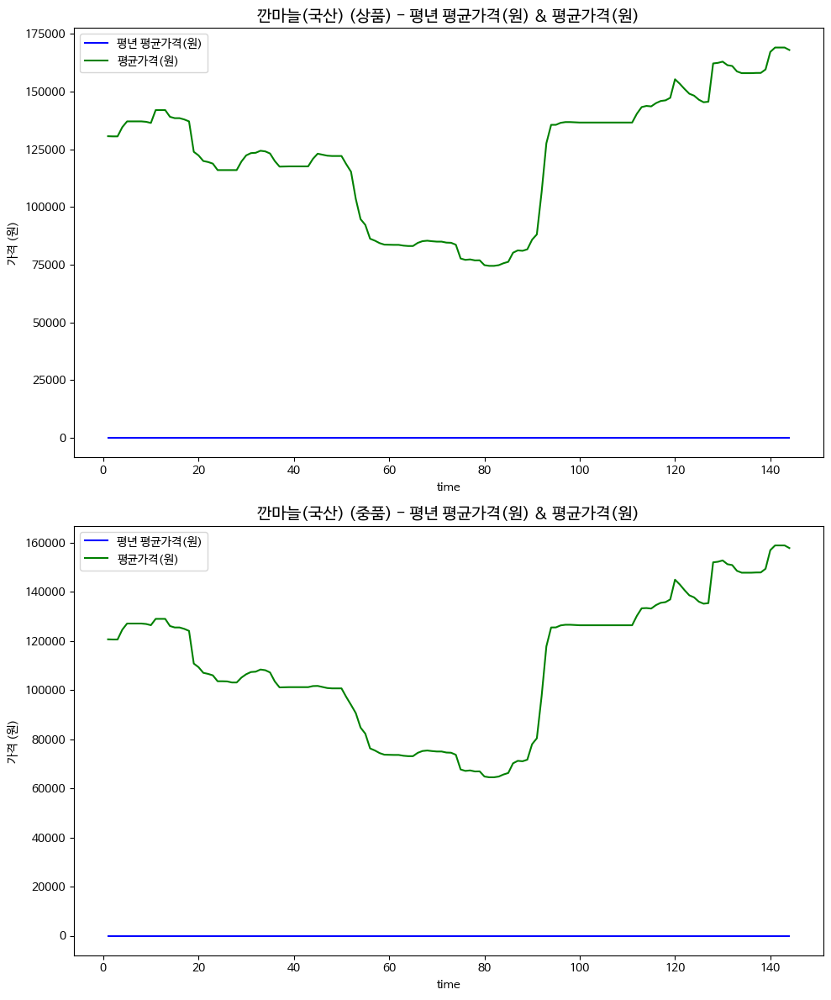

In [ ]:
import matplotlib.pyplot as plt

# '감자' 품목에 대한 데이터 필터링
potato = df[df['품목명'] == '깐마늘(국산)']

# 고유한 '품종명'과 '등급'의 조합 목록 추출
unique_combinations = potato[['품종명', '등급']].drop_duplicates()

# 서브플롯 설정 (품종명 * 등급별로 하나의 그래프)
fig, axes = plt.subplots(len(unique_combinations), 1, figsize=(10, 6 * len(unique_combinations)))

# 만약 조합이 하나라면 axes가 배열이 아니므로 배열로 만듦
if len(unique_combinations) == 1:
    axes = [axes]

# 각 '품종명'과 '등급' 조합별로 그래프 그리기
for i, (variety, grade) in enumerate(unique_combinations.itertuples(index=False)):
    # 현재 '품종명'과 '등급'에 해당하는 데이터만 추출
    variety_grade_data = potato[(potato['품종명'] == variety) & (potato['등급'] == grade)]

    # 현재 서브플롯 선택
    ax = axes[i]

    # 평년 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평년 평균가격(원)'], label='평년 평균가격(원)', color='b')

    # 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평균가격(원)'], label='평균가격(원)', color='g')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{variety} ({grade}) - 평년 평균가격(원) & 평균가격(원)', fontsize=14)
    ax.set_xlabel('time', fontsize=10)
    ax.set_ylabel('가격 (원)', fontsize=10)

    # 범례 추가
    ax.legend()

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


### 무

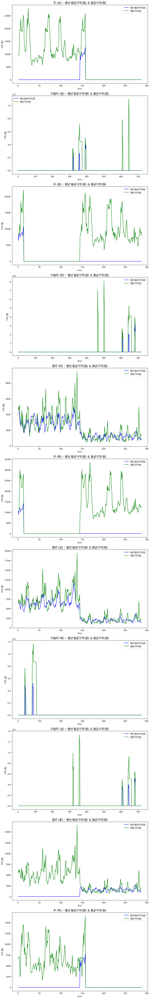

In [ ]:
import matplotlib.pyplot as plt

# '감자' 품목에 대한 데이터 필터링
potato = df[df['품목명'] == '무']

# 고유한 '품종명'과 '등급'의 조합 목록 추출
unique_combinations = potato[['품종명', '등급']].drop_duplicates()

# 서브플롯 설정 (품종명 * 등급별로 하나의 그래프)
fig, axes = plt.subplots(len(unique_combinations), 1, figsize=(10, 6 * len(unique_combinations)))

# 만약 조합이 하나라면 axes가 배열이 아니므로 배열로 만듦
if len(unique_combinations) == 1:
    axes = [axes]

# 각 '품종명'과 '등급' 조합별로 그래프 그리기
for i, (variety, grade) in enumerate(unique_combinations.itertuples(index=False)):
    # 현재 '품종명'과 '등급'에 해당하는 데이터만 추출
    variety_grade_data = potato[(potato['품종명'] == variety) & (potato['등급'] == grade)]

    # 현재 서브플롯 선택
    ax = axes[i]

    # 평년 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평년 평균가격(원)'], label='평년 평균가격(원)', color='b')

    # 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평균가격(원)'], label='평균가격(원)', color='g')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{variety} ({grade}) - 평년 평균가격(원) & 평균가격(원)', fontsize=14)
    ax.set_xlabel('time', fontsize=10)
    ax.set_ylabel('가격 (원)', fontsize=10)

    # 범례 추가
    ax.legend()

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


### 상추

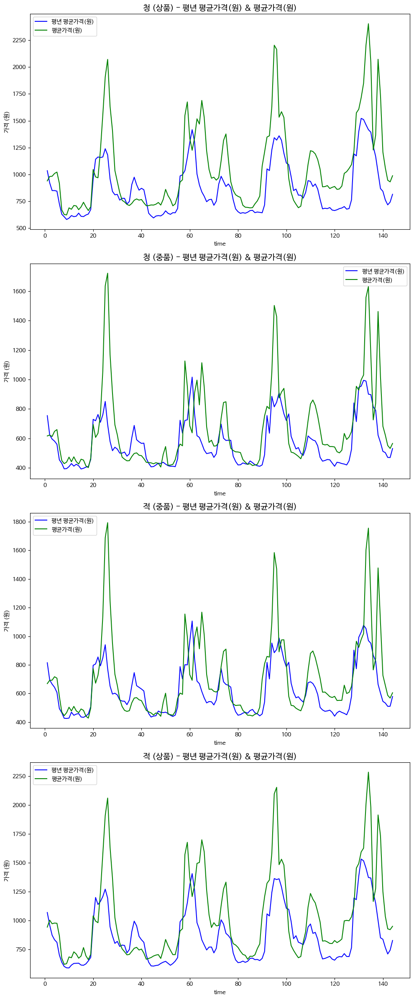

In [ ]:
import matplotlib.pyplot as plt

# '감자' 품목에 대한 데이터 필터링
potato = df[df['품목명'] == '상추']

# 고유한 '품종명'과 '등급'의 조합 목록 추출
unique_combinations = potato[['품종명', '등급']].drop_duplicates()

# 서브플롯 설정 (품종명 * 등급별로 하나의 그래프)
fig, axes = plt.subplots(len(unique_combinations), 1, figsize=(10, 6 * len(unique_combinations)))

# 만약 조합이 하나라면 axes가 배열이 아니므로 배열로 만듦
if len(unique_combinations) == 1:
    axes = [axes]

# 각 '품종명'과 '등급' 조합별로 그래프 그리기
for i, (variety, grade) in enumerate(unique_combinations.itertuples(index=False)):
    # 현재 '품종명'과 '등급'에 해당하는 데이터만 추출
    variety_grade_data = potato[(potato['품종명'] == variety) & (potato['등급'] == grade)]

    # 현재 서브플롯 선택
    ax = axes[i]

    # 평년 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평년 평균가격(원)'], label='평년 평균가격(원)', color='b')

    # 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평균가격(원)'], label='평균가격(원)', color='g')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{variety} ({grade}) - 평년 평균가격(원) & 평균가격(원)', fontsize=14)
    ax.set_xlabel('time', fontsize=10)
    ax.set_ylabel('가격 (원)', fontsize=10)

    # 범례 추가
    ax.legend()

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


### 배추

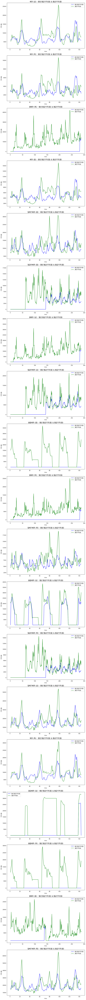

In [ ]:
import matplotlib.pyplot as plt

# '감자' 품목에 대한 데이터 필터링
potato = df[df['품목명'] == '배추']

# 고유한 '품종명'과 '등급'의 조합 목록 추출
unique_combinations = potato[['품종명', '등급']].drop_duplicates()

# 서브플롯 설정 (품종명 * 등급별로 하나의 그래프)
fig, axes = plt.subplots(len(unique_combinations), 1, figsize=(10, 6 * len(unique_combinations)))

# 만약 조합이 하나라면 axes가 배열이 아니므로 배열로 만듦
if len(unique_combinations) == 1:
    axes = [axes]

# 각 '품종명'과 '등급' 조합별로 그래프 그리기
for i, (variety, grade) in enumerate(unique_combinations.itertuples(index=False)):
    # 현재 '품종명'과 '등급'에 해당하는 데이터만 추출
    variety_grade_data = potato[(potato['품종명'] == variety) & (potato['등급'] == grade)]

    # 현재 서브플롯 선택
    ax = axes[i]

    # 평년 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평년 평균가격(원)'], label='평년 평균가격(원)', color='b')

    # 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평균가격(원)'], label='평균가격(원)', color='g')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{variety} ({grade}) - 평년 평균가격(원) & 평균가격(원)', fontsize=14)
    ax.set_xlabel('time', fontsize=10)
    ax.set_ylabel('가격 (원)', fontsize=10)

    # 범례 추가
    ax.legend()

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


### 양파

<ipython-input-57-d217ea3bbc89>:39: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


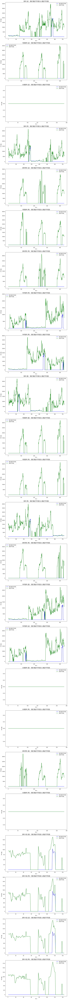

In [ ]:
import matplotlib.pyplot as plt

# '감자' 품목에 대한 데이터 필터링
potato = df[df['품목명'] == '양파']

# 고유한 '품종명'과 '등급'의 조합 목록 추출
unique_combinations = potato[['품종명', '등급']].drop_duplicates()

# 서브플롯 설정 (품종명 * 등급별로 하나의 그래프)
fig, axes = plt.subplots(len(unique_combinations), 1, figsize=(10, 6 * len(unique_combinations)))

# 만약 조합이 하나라면 axes가 배열이 아니므로 배열로 만듦
if len(unique_combinations) == 1:
    axes = [axes]

# 각 '품종명'과 '등급' 조합별로 그래프 그리기
for i, (variety, grade) in enumerate(unique_combinations.itertuples(index=False)):
    # 현재 '품종명'과 '등급'에 해당하는 데이터만 추출
    variety_grade_data = potato[(potato['품종명'] == variety) & (potato['등급'] == grade)]

    # 현재 서브플롯 선택
    ax = axes[i]

    # 평년 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평년 평균가격(원)'], label='평년 평균가격(원)', color='b')

    # 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평균가격(원)'], label='평균가격(원)', color='g')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{variety} ({grade}) - 평년 평균가격(원) & 평균가격(원)', fontsize=14)
    ax.set_xlabel('time', fontsize=10)
    ax.set_ylabel('가격 (원)', fontsize=10)

    # 범례 추가
    ax.legend()

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


### 대파

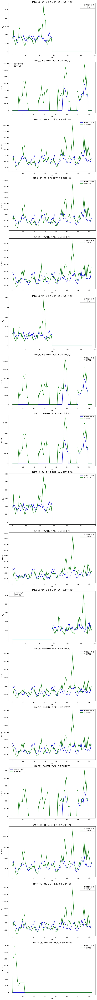

In [ ]:
import matplotlib.pyplot as plt

# '감자' 품목에 대한 데이터 필터링
potato = df[df['품목명'] == '대파']

# 고유한 '품종명'과 '등급'의 조합 목록 추출
unique_combinations = potato[['품종명', '등급']].drop_duplicates()

# 서브플롯 설정 (품종명 * 등급별로 하나의 그래프)
fig, axes = plt.subplots(len(unique_combinations), 1, figsize=(10, 6 * len(unique_combinations)))

# 만약 조합이 하나라면 axes가 배열이 아니므로 배열로 만듦
if len(unique_combinations) == 1:
    axes = [axes]

# 각 '품종명'과 '등급' 조합별로 그래프 그리기
for i, (variety, grade) in enumerate(unique_combinations.itertuples(index=False)):
    # 현재 '품종명'과 '등급'에 해당하는 데이터만 추출
    variety_grade_data = potato[(potato['품종명'] == variety) & (potato['등급'] == grade)]

    # 현재 서브플롯 선택
    ax = axes[i]

    # 평년 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평년 평균가격(원)'], label='평년 평균가격(원)', color='b')

    # 평균가격(원) 선 그래프
    ax.plot(variety_grade_data['time'], variety_grade_data['평균가격(원)'], label='평균가격(원)', color='g')

    # 그래프 제목 및 축 라벨 설정
    ax.set_title(f'{variety} ({grade}) - 평년 평균가격(원) & 평균가격(원)', fontsize=14)
    ax.set_xlabel('time', fontsize=10)
    ax.set_ylabel('가격 (원)', fontsize=10)

    # 범례 추가
    ax.legend()

# 그래프 레이아웃 조정
plt.tight_layout()
plt.show()


## 산지공판장 데이터

In [ ]:
sanji = pd.read_csv('./train/meta/TRAIN_산지공판장_2018-2021.csv')
sanji.head(5)

,시점,공판장코드,공판장명,품목코드,품목명,품종코드,품종명,등급코드,등급명,총반입량(kg),...,평균가(원/kg),중간가(원/kg),최저가(원/kg),최고가(원/kg),경매 건수,전순 평균가격(원) PreVious SOON,전달 평균가격(원) PreVious MMonth,전년 평균가격(원) PreVious YeaR,평년 평균가격(원) Common Year SOON,연도
0,201801상순,1000000000,*전국농협공판장,501,감자,50101,수미,11,특,15470.0,...,1712.637363,1723.961039,1545.454545,2320.666667,7,1947.350427,1769.858320,1023.982379,0.0,2018
1,201801상순,1000000000,*전국농협공판장,501,감자,50101,수미,12,상,2900.0,...,1198.655172,1252.737207,893.055556,1417.857143,4,1301.239669,1348.253676,571.311475,0.0,2018
2,201801상순,1000000000,*전국농협공판장,501,감자,50199,기타감자,13,보통,1320.0,...,615.000000,600.000000,240.000000,911.875000,7,630.851064,449.166667,473.032787,0.0,2018
3,201801상순,1000000000,*전국농협공판장,501,감자,50199,기타감자,12,상,460.0,...,544.130435,365.000000,200.000000,1650.000000,5,1088.046875,1129.600000,734.024390,0.0,2018
4,201801상순,1000000000,*전국농협공판장,501,감자,50199,기타감자,11,특,30967.0,...,1876.454484,2010.440477,1598.327715,2438.720588,8,2126.402457,1779.262728,1750.544700,0.0,2018


In [ ]:
sanji.rename(columns = {'등급명' : '등급'}, inplace = True)

In [ ]:
# 두 데이터프레임을 '품목명', '품종명', '등급' 기준으로 병합 (left join)
result = pd.merge(df, sanji, on=['품목명', '품종명', '등급', '시점'], how='left')

# 결과 확인
result

,시점,품목명,품종명,거래단위,등급,평년 평균가격(원),평균가격(원),time,공판장코드,공판장명,...,평균가(원/kg),중간가(원/kg),최저가(원/kg),최고가(원/kg),경매 건수,전순 평균가격(원) PreVious SOON,전달 평균가격(원) PreVious MMonth,전년 평균가격(원) PreVious YeaR,평년 평균가격(원) Common Year SOON,연도
0,201801상순,건고추,화건,30 kg,상품,381666.666667,590000.0,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,201801중순,건고추,화건,30 kg,상품,380809.666667,590000.0,2,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,201801하순,건고추,화건,30 kg,상품,380000.000000,590000.0,3,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,201802상순,건고추,화건,30 kg,상품,380000.000000,590000.0,4,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,201802중순,건고추,화건,30 kg,상품,376666.666667,590000.0,5,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39401,202112중순,대파,대파(일반),10키로묶음,상,0.000000,0.0,287,4.028211e+09,전주농협공판장,...,325.000000,325.000000,325.000000,325.0,1.0,375.000000,375.000000,0.000000,0.000000,2021.0
39402,202112중순,대파,대파(일반),10키로묶음,상,0.000000,0.0,287,4.058200e+09,김제원예농업협동조합공판장,...,409.782609,500.000000,323.076923,750.0,10.0,436.567164,521.691176,800.000000,0.000000,2021.0
39403,202112하순,대파,대파(일반),10키로묶음,상,0.000000,0.0,288,1.000000e+09,*전국농협공판장,...,478.438662,462.368421,250.000000,575.0,6.0,424.687500,523.018293,888.582677,621.965622,2021.0
39404,202112하순,대파,대파(일반),10키로묶음,상,0.000000,0.0,288,4.028211e+09,전주농협공판장,...,557.894737,412.500000,250.000000,575.0,2.0,325.000000,597.058824,0.000000,0.000000,2021.0


## 전국도매 데이터

In [ ]:
domae = pd.read_csv('./train/meta/TRAIN_전국도매_2018-2021.csv')
domae.head(5)

,시점,시장코드,시장명,품목코드,품목명,품종코드,품종명,총반입량(kg),총거래금액(원),평균가(원/kg),...,저가(20%) 평균가,중간가(원/kg),최저가(원/kg),최고가(원/kg),경매 건수,전순 평균가격(원) PreVious SOON,전달 평균가격(원) PreVious MMonth,전년 평균가격(원) PreVious YeaR,평년 평균가격(원) Common Year SOON,연도
0,201801상순,100000,*전국도매시장,501,감자,50124,깐감자,20.0,86520,4326.000000,...,4326.000000,4326.000000,4326.0,4326.000000,1,0.000000,4009.000000,0.000000,0.000000,2018
1,201801상순,100000,*전국도매시장,501,감자,50121,돼지감자,12380.0,11650810,941.099354,...,545.105717,1010.000000,200.0,3000.000000,117,11213.358450,9174.196723,8167.895632,0.000000,2018
2,201801상순,100000,*전국도매시장,501,감자,50110,자주감자,240.0,158400,660.000000,...,500.000000,550.000000,500.0,1000.000000,7,12553.279352,12612.216445,24990.324897,18483.961304,2018
3,201801상순,100000,*전국도매시장,501,감자,50111,가을감자,10.0,37500,3750.000000,...,3700.000000,3750.000000,3700.0,3800.000000,2,24929.463415,40365.081269,0.000000,0.000000,2018
4,201801상순,100000,*전국도매시장,501,감자,50199,기타감자,1367301.3,2403199462,1757.622451,...,955.289668,1360.453431,0.0,10581.081081,872,30806.779529,27661.150770,23741.953223,19340.121989,2018
